# Parking Space Occupancy Detection

In this project we are going to predict the bounding boxes (object detection) of each occupied and empty space. We are going to use the YOLOv8 algorithm to do this.



In [11]:
'''
import zipfile

path_to_zip_file = "data/archive.zip"
directory_to_extract_to = "data/"

with zipfile.ZipFile(path_to_zip_file, 'r') as zip_ref:
    zip_ref.extractall(directory_to_extract_to)
'''

'\nimport zipfile\n\npath_to_zip_file = "data/archive.zip"\ndirectory_to_extract_to = "data/"\n\nwith zipfile.ZipFile(path_to_zip_file, \'r\') as zip_ref:\n    zip_ref.extractall(directory_to_extract_to)\n'

### Merge all folders into one

In [12]:
import os
import shutil

source_folders = [
    "data/PKLot/PKLot/PKLot/PUCPR/Cloudy",
    "data/PKLot/PKLot/PKLot/PUCPR/Sunny",
    "data/PKLot/PKLot/PKLot/PUCPR/Rainy",
    "data/PKLot/PKLot/PKLot/UFPR04/Cloudy",
    "data/PKLot/PKLot/PKLot/UFPR04/Sunny",
    "data/PKLot/PKLot/PKLot/UFPR04/Rainy",
    "data/PKLot/PKLot/PKLot/UFPR05/Cloudy",
    "data/PKLot/PKLot/PKLot/UFPR05/Sunny",
    "data/PKLot/PKLot/PKLot/UFPR05/Rainy"
]

destination_folder = "data/total-content"

if not os.path.exists(destination_folder):
    os.makedirs(destination_folder)

# Iterate through source folders and merge contents
for source_folder in source_folders:
    for root, _, files in os.walk(source_folder):
        for file in files:
            source_file_path = os.path.join(root, file)
            destination_file_path = os.path.join(destination_folder, file)
            shutil.copy(source_file_path, destination_file_path)

print("Contents merged successfully.")

Contents merged successfully.


### Modify labels

In [13]:
import xml.etree.ElementTree as ET

input_folder = "data/total-content"
output_folder = "data/labels-xml"

image_width = 1280
image_height = 720

class_mapping = {"1": 1, "0": 0}

if not os.path.exists(output_folder):
    os.makedirs(output_folder)

xml_files = [f for f in os.listdir(input_folder) if f.endswith(".xml")]
for xml_file in xml_files:
    xml_path = os.path.join(input_folder, xml_file)
    
    tree = ET.parse(xml_path)
    root = tree.getroot()
    
    txt_filename = os.path.splitext(xml_file)[0] + ".txt"
    txt_path = os.path.join(output_folder, txt_filename)

    with open(txt_path, "w") as txt_file:
        for space in root.findall("space"):
            occupied = space.get("occupied")
            class_index = class_mapping.get(occupied, -1)
            
            if class_index == -1:
                continue
            
            rotated_rect = space.find("rotatedRect")
            center = rotated_rect.find("center")
            size = rotated_rect.find("size")
            
            center_x = float(center.get("x"))
            center_y = float(center.get("y"))
            width = float(size.get("w"))
            height = float(size.get("h"))
            
            x_center = center_x / image_width
            y_center = center_y / image_height
            w = width / image_width
            h = height / image_height
            
            txt_file.write(f"{class_index} {x_center:.6f} {y_center:.6f} {w:.6f} {h:.6f}\n")
    
    new_xml_path = os.path.join(output_folder, xml_file)
    os.rename(xml_path, new_xml_path)

print("Annotations generated and XML files moved.")

Annotations generated and XML files moved.


In [14]:
# Move the txt files from the xml folder to the total-content folder

source_folder = "data/labels-xml"
destination_folder = "data/total-content"

txt_files = [f for f in os.listdir(source_folder) if f.endswith(".txt")]

for txt_file in txt_files:
    source_path = os.path.join(source_folder, txt_file)
    destination_path = os.path.join(destination_folder, txt_file)
    shutil.move(source_path, destination_path)

print("TXT files moved to data/total-content folder.")

TXT files moved to data/total-content folder.


### Train - Test - Val folders split

In [15]:
import random
import os

# remove the image that has no corresponding txt file

file_path = "data/total-content/2012-11-06_18_48_46.jpg"
try:
    os.remove(file_path)
    print(f"File '{file_path}' has been removed successfully.")
except OSError as e:
    print(f"Error removing the file '{file_path}': {e}")


source_folder = "data/total-content"
train_folder = "data/train"
test_folder = "data/test"
val_folder = "data/val"

train_ratio = 0.7
test_ratio = 0.15
val_ratio = 0.15

for folder in [train_folder, test_folder, val_folder]:
    if not os.path.exists(folder):
        os.makedirs(folder)

all_files = os.listdir(source_folder)
image_files = [f for f in all_files if f.endswith(".jpg")]

# Calculate the number of samples for each split
num_samples = len(image_files)
num_train = int(train_ratio * num_samples)
num_test = int(test_ratio * num_samples)
num_val = num_samples - num_train - num_test

random.shuffle(image_files)

train_files = image_files[:num_train]
test_files = image_files[num_train:num_train + num_test]
val_files = image_files[num_train + num_test:]

# Move corresponding txt files along with images
for folder, files in [(train_folder, train_files), (test_folder, test_files), (val_folder, val_files)]:
    for file in files:
        # Move image file
        source_image_path = os.path.join(source_folder, file)
        destination_image_path = os.path.join(folder, file)
        shutil.move(source_image_path, destination_image_path)
        
        # Move corresponding txt file
        txt_file = os.path.splitext(file)[0] + ".txt"
        source_txt_path = os.path.join(source_folder, txt_file)
        destination_txt_path = os.path.join(folder, txt_file)
        shutil.move(source_txt_path, destination_txt_path)

print("Data split into train, test, and val sets.")

File 'data/total-content/2012-11-06_18_48_46.jpg' has been removed successfully.
Data split into train, test, and val sets.


In [16]:


datasets = ['train', 'val', 'test']
source_folder = 'data'

for dataset in datasets:
	dataset_folder = os.path.join(source_folder, dataset)
	
	# Create "images" and "labels" folders
	images_folder = os.path.join(dataset_folder, "images")
	labels_folder = os.path.join(dataset_folder, "labels")
	os.makedirs(images_folder, exist_ok=True)
	os.makedirs(labels_folder, exist_ok=True)
	
	# Organize image and label files
	for file in os.listdir(dataset_folder):
		if file.endswith(".jpg"):
			image_path = os.path.join(dataset_folder, file)
			image_destination = os.path.join(images_folder, file)
			shutil.move(image_path, image_destination)
		elif file.endswith(".txt"):
			label_path = os.path.join(dataset_folder, file)
			label_destination = os.path.join(labels_folder, file)
			shutil.move(label_path, label_destination)

print("Datasets organized successfully.")

Datasets organized successfully.


## Model Loading, Fine Tuning and Evaluation

In [17]:

from ultralytics import YOLO
model = YOLO("yolov8s.pt")

In [18]:
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
print(tf.__version__)


Num GPUs Available:  1
2.13.0


In [19]:
physical_devices = tf.config.experimental.list_physical_devices('GPU')

tf.config.set_visible_devices(physical_devices[0:1], 'GPU')


In [20]:
#import torch

#device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Then, pass the 'device' variable to your model.train function
model.train(data="/Users/siddhanthsalian/Downloads/parking-lot-prediction-main/data/data.yaml", epochs=2)


New https://pypi.org/project/ultralytics/8.0.203 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.188 🚀 Python-3.10.12 torch-2.0.0.post2 CPU (Apple M1 Pro)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/Users/siddhanthsalian/Downloads/parking-lot-prediction-main/data/data.yaml, epochs=2, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=N

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x2b8e41000>
fitness: 0.8854566507812845
keys: ['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)']
maps: array([    0.87701,     0.87032])
names: {0: 'empty', 1: 'occupied'}
plot: True
results_dict: {'metrics/precision(B)': 0.9641798147552696, 'metrics/recall(B)': 0.9925560235910036, 'metrics/mAP50(B)': 0.991619888644607, 'metrics/mAP50-95(B)': 0.8736607354631376, 'fitness': 0.8854566507812845}
save_dir: PosixPath('runs/detect/train12')
speed: {'preprocess': 0.2618084406968676, 'inference': 202.53121277566174, 'loss': 5.3294089417577104e-05, 'postprocess': 0.5061237320577077}

In [37]:
print(model)

YOLO(
  (model): DetectionModel(
    (model): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (act): SiLU(inplace=True)
      )
      (1): Conv(
        (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (act): SiLU(inplace=True)
      )
      (2): C2f(
        (cv1): Conv(
          (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
          (act): SiLU(inplace=True)
        )
        (cv2): Conv(
          (conv): Conv2d(96, 64, kernel_size=(1, 1), stride=(1, 1))
          (act): SiLU(inplace=True)
        )
        (m): ModuleList(
          (0): Bottleneck(
            (cv1): Conv(
              (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
              (act): SiLU(inplace=True)
            )
            (cv2): Conv(
              (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
              (act): SiLU(inplace=True)
   

## Prediction on test set

In this section we will be using the fine-tuned model to predict the bounding boxes and classes of the images in the test set. A random image will be taken from the test set. The amount of bounding boxes will be shown first and then the image with the bounding boxes and classes. 

In [21]:
from PIL import Image

test_images_directory = "./data/test/images"

image_files = [f for f in os.listdir(test_images_directory) if f.lower().endswith(".jpg")]

random_image_filename = random.choice(image_files)
random_image_path = os.path.join(test_images_directory, random_image_filename)

results = model.predict(random_image_path)

result = results[0]

print(len(result.boxes))


image 1/1 /Users/siddhanthsalian/Downloads/parking-lot-prediction-main/data/test/images/2012-12-18_20_40_17.jpg: 384x640 7 emptys, 21 occupieds, 162.4ms
Speed: 1.3ms preprocess, 162.4ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)


28


In [22]:
for box in result.boxes:
	label = result.names[box.cls[0].item()]
	coords = [round(x) for x in box.xyxy[0].tolist()]
	prob = round(box.conf[0].item(), 4)
	print("Object: {}\nCoordinates: {}\nProbability: {}".format(label, coords, prob))

Object: occupied
Coordinates: [265, 239, 322, 310]
Probability: 0.9597
Object: occupied
Coordinates: [678, 545, 771, 701]
Probability: 0.9402
Object: occupied
Coordinates: [370, 255, 428, 320]
Probability: 0.938
Object: occupied
Coordinates: [191, 283, 260, 363]
Probability: 0.9376
Object: occupied
Coordinates: [325, 211, 378, 269]
Probability: 0.9357
Object: occupied
Coordinates: [780, 382, 843, 504]
Probability: 0.9331
Object: occupied
Coordinates: [804, 309, 866, 423]
Probability: 0.932
Object: occupied
Coordinates: [423, 215, 472, 278]
Probability: 0.9277
Object: occupied
Coordinates: [511, 147, 553, 207]
Probability: 0.9218
Object: occupied
Coordinates: [473, 183, 520, 240]
Probability: 0.9167
Object: occupied
Coordinates: [838, 265, 891, 366]
Probability: 0.9152
Object: occupied
Coordinates: [883, 177, 925, 274]
Probability: 0.9113
Object: occupied
Coordinates: [377, 172, 423, 231]
Probability: 0.9094
Object: occupied
Coordinates: [425, 141, 465, 204]
Probability: 0.8945
Object: 

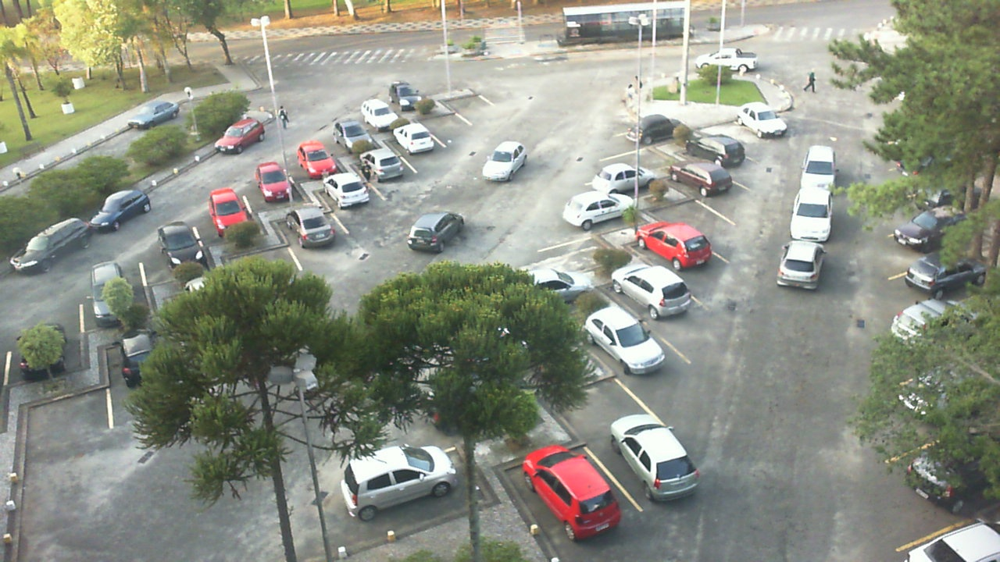

In [23]:
# Original image

Image.open(random_image_path)

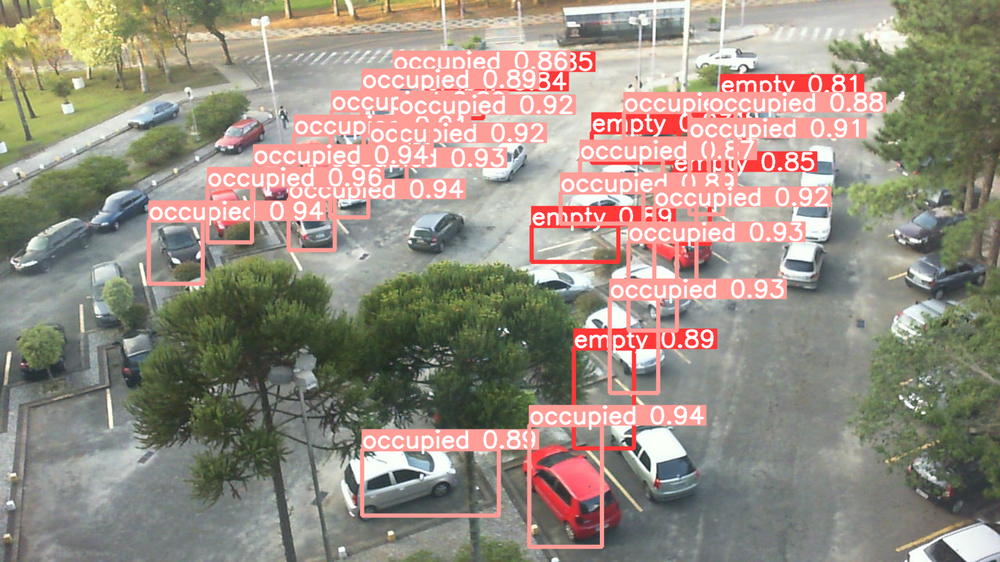

In [24]:
# Image with the result of the model

Image.fromarray(result.plot()[:,:,::-1])

In [25]:
from PIL import Image

test_images_directory = "./data/test/images"

image_files = [f for f in os.listdir(test_images_directory) if f.lower().endswith(".jpg")]

random_image_filename = random.choice(image_files)
random_image_path = os.path.join(test_images_directory, random_image_filename)

results = model.predict(random_image_path)

result = results[0]

print(len(result.boxes))


image 1/1 /Users/siddhanthsalian/Downloads/parking-lot-prediction-main/data/test/images/2013-03-15_16_35_12.jpg: 384x640 5 emptys, 35 occupieds, 178.8ms
Speed: 1.2ms preprocess, 178.8ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)


40


In [26]:
for box in result.boxes:
	label = result.names[box.cls[0].item()]
	coords = [round(x) for x in box.xyxy[0].tolist()]
	prob = round(box.conf[0].item(), 4)
	print("Object: {}\nCoordinates: {}\nProbability: {}".format(label, coords, prob))

Object: occupied
Coordinates: [815, 137, 870, 207]
Probability: 0.9559
Object: occupied
Coordinates: [413, 180, 464, 288]
Probability: 0.9541
Object: occupied
Coordinates: [579, 240, 636, 363]
Probability: 0.9513
Object: occupied
Coordinates: [1088, 211, 1141, 311]
Probability: 0.951
Object: occupied
Coordinates: [632, 311, 692, 421]
Probability: 0.9503
Object: occupied
Coordinates: [672, 373, 737, 499]
Probability: 0.9498
Object: occupied
Coordinates: [472, 282, 533, 416]
Probability: 0.9498
Object: occupied
Coordinates: [759, 459, 833, 580]
Probability: 0.9488
Object: occupied
Coordinates: [845, 43, 889, 141]
Probability: 0.9469
Object: occupied
Coordinates: [1162, 260, 1229, 374]
Probability: 0.9459
Object: occupied
Coordinates: [1099, 332, 1168, 433]
Probability: 0.9445
Object: occupied
Coordinates: [509, 142, 552, 251]
Probability: 0.9438
Object: occupied
Coordinates: [518, 348, 581, 486]
Probability: 0.9438
Object: occupied
Coordinates: [576, 417, 643, 572]
Probability: 0.9437
Ob

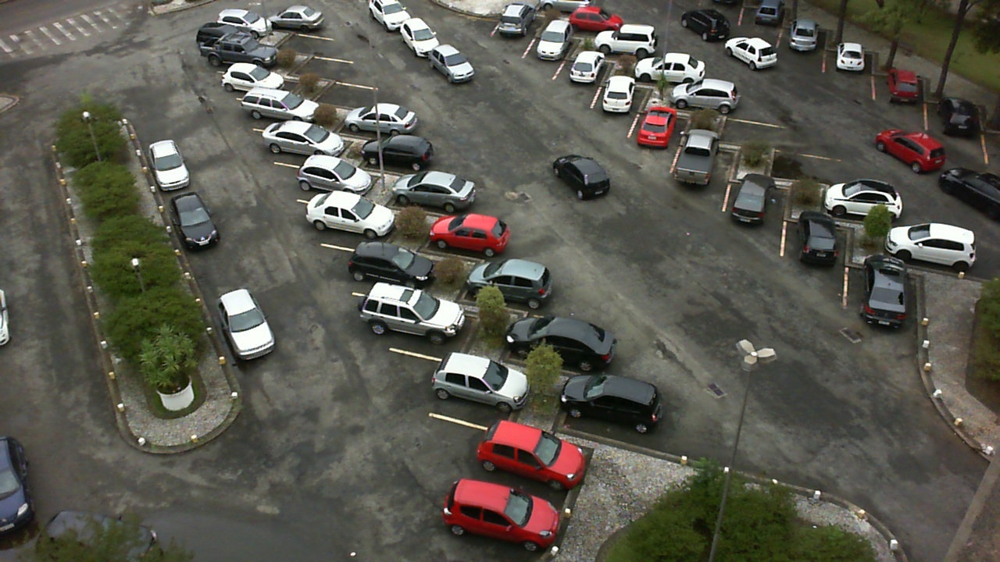

In [27]:
# Original image

Image.open(random_image_path)

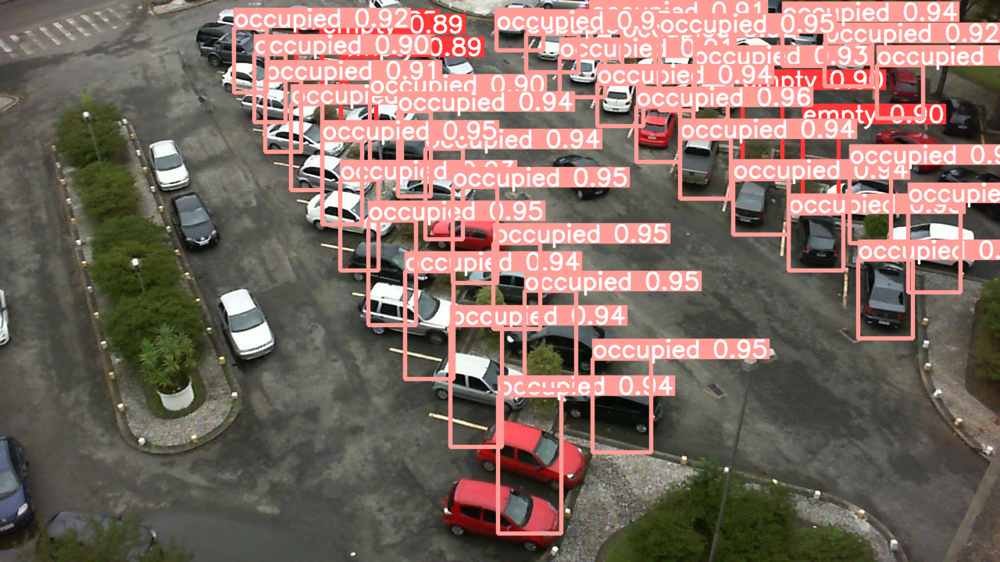

In [28]:
# Image with the result of the model

Image.fromarray(result.plot()[:,:,::-1])

In [29]:
from PIL import Image

test_images_directory = "./data/test/images"

image_files = [f for f in os.listdir(test_images_directory) if f.lower().endswith(".jpg")]

random_image_filename = random.choice(image_files)
random_image_path = os.path.join(test_images_directory, random_image_filename)

results = model.predict(random_image_path)

result = results[0]

print(len(result.boxes))

for box in result.boxes:
    label = result.names[box.cls[0].item()]
    coords = [round(x) for x in box.xyxy[0].tolist()]
    prob = round(box.conf[0].item(), 4)
    print("Object: {}\nCoordinates: {}\nProbability: {}".format(label, coords, prob))



image 1/1 /Users/siddhanthsalian/Downloads/parking-lot-prediction-main/data/test/images/2013-03-17_07_50_02.jpg: 384x640 40 emptys, 170.1ms
Speed: 1.2ms preprocess, 170.1ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)


40
Object: empty
Coordinates: [469, 282, 531, 414]
Probability: 0.9322
Object: empty
Coordinates: [633, 508, 716, 683]
Probability: 0.9276
Object: empty
Coordinates: [516, 346, 580, 486]
Probability: 0.9266
Object: empty
Coordinates: [575, 415, 643, 570]
Probability: 0.924
Object: empty
Coordinates: [761, 462, 834, 580]
Probability: 0.9229
Object: empty
Coordinates: [671, 371, 739, 499]
Probability: 0.9217
Object: empty
Coordinates: [633, 308, 692, 418]
Probability: 0.919
Object: empty
Coordinates: [949, 113, 999, 212]
Probability: 0.9173
Object: empty
Coordinates: [436, 71, 483, 171]
Probability: 0.915
Object: empty
Coordinates: [1162, 258, 1228, 373]
Probability: 0.9149
Object: empty
Coordinates: [580, 240, 635, 361]
Probability: 0.9149
Object: empty
Coordinates: [870, 178, 935, 251]
Probability: 0.9129
Object: empty
Coordinates: [544, 189, 593, 304]
Probability: 0.906
Object: empty
Coordinates: [1085, 208, 1139, 311]
Probability: 0.9051
Object: empty
Coordinates: [1023, 155, 1072, 2

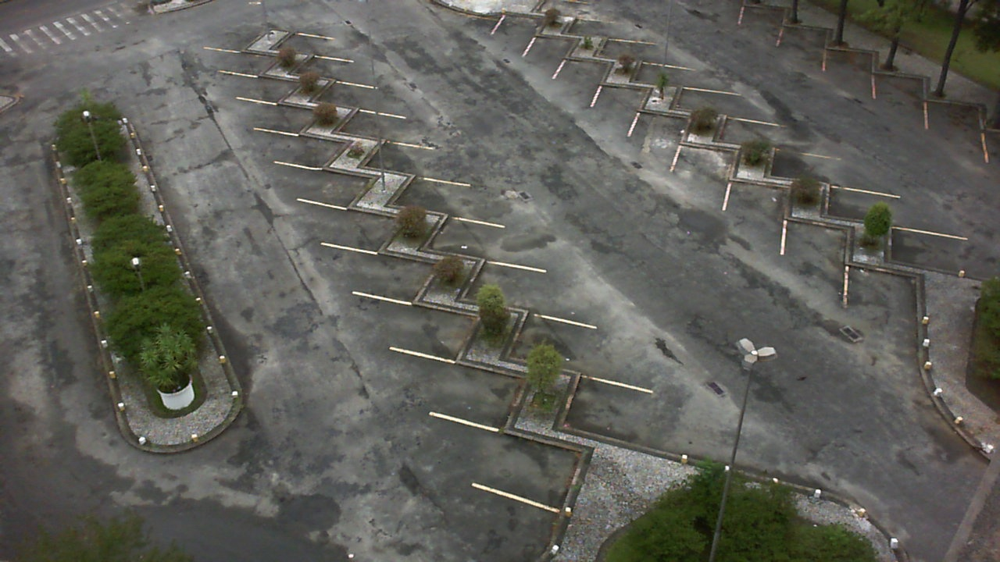

In [30]:
Image.open(random_image_path)

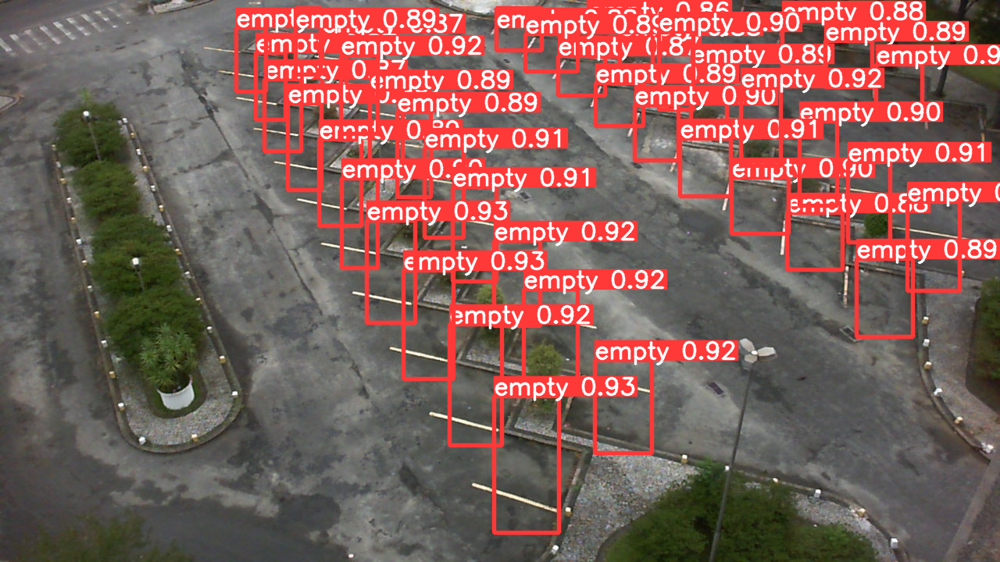

In [31]:
Image.fromarray(result.plot()[:,:,::-1])

In [32]:
from PIL import Image

test_images_directory = "./data/test/images"

image_files = [f for f in os.listdir(test_images_directory) if f.lower().endswith(".jpg")]

random_image_filename = random.choice(image_files)
random_image_path = os.path.join(test_images_directory, random_image_filename)

results = model.predict(random_image_path)

result = results[0]

print(len(result.boxes))

for box in result.boxes:
    label = result.names[box.cls[0].item()]
    coords = [round(x) for x in box.xyxy[0].tolist()]
    prob = round(box.conf[0].item(), 4)
    print("Object: {}\nCoordinates: {}\nProbability: {}".format(label, coords, prob))



image 1/1 /Users/siddhanthsalian/Downloads/parking-lot-prediction-main/data/test/images/2012-12-14_20_15_17.jpg: 384x640 7 emptys, 21 occupieds, 226.9ms
Speed: 1.8ms preprocess, 226.9ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)


28
Object: occupied
Coordinates: [191, 282, 258, 362]
Probability: 0.9575
Object: occupied
Coordinates: [370, 252, 428, 318]
Probability: 0.9425
Object: occupied
Coordinates: [806, 310, 868, 424]
Probability: 0.9402
Object: occupied
Coordinates: [677, 547, 770, 700]
Probability: 0.9394
Object: empty
Coordinates: [263, 238, 322, 310]
Probability: 0.9302
Object: occupied
Coordinates: [862, 216, 910, 313]
Probability: 0.9247
Object: occupied
Coordinates: [839, 266, 893, 367]
Probability: 0.9201
Object: occupied
Coordinates: [377, 174, 423, 233]
Probability: 0.9198
Object: occupied
Coordinates: [472, 181, 520, 241]
Probability: 0.916
Object: empty
Coordinates: [780, 382, 844, 502]
Probability: 0.9065
Object: occupied
Coordinates: [682, 290, 794, 334]
Probability: 0.9035
Object: occupied
Coordinates: [510, 147, 553, 207]
Probability: 0.9017
Object: occupied
Coordinates: [464, 112, 508, 173]
Probability: 0.8987
Object: occupied
Coordinates: [424, 139, 466, 204]
Probability: 0.8964
Object: em

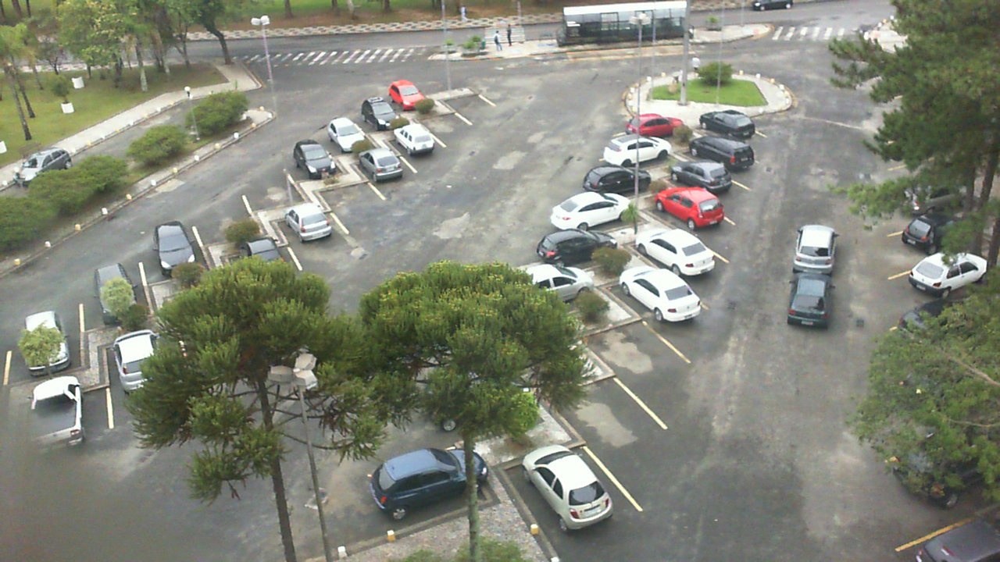

In [33]:
Image.open(random_image_path) 

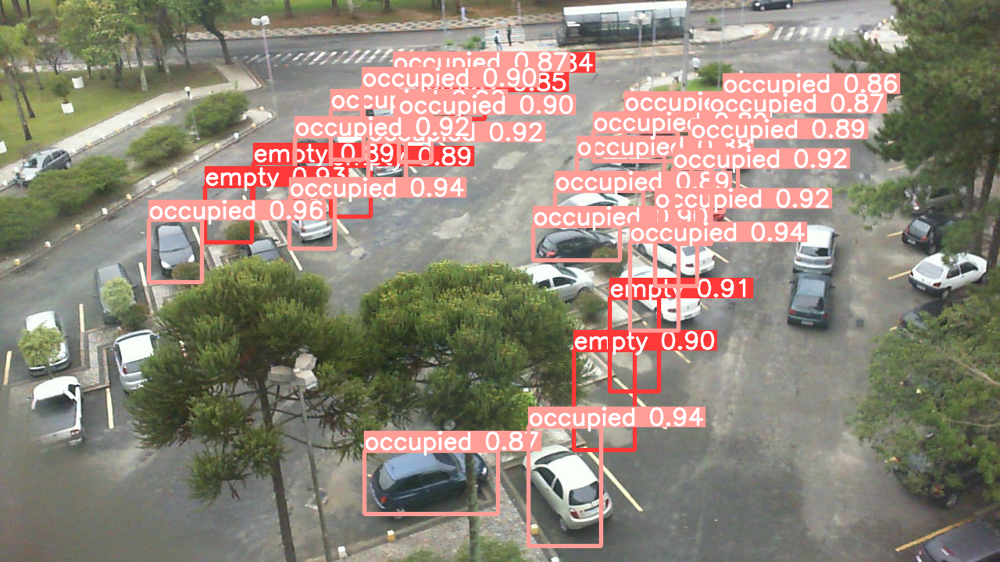

In [34]:
Image.fromarray(result.plot()[:,:,::-1])